In [59]:
import os
import glob
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
from nilearn import connectome
from nilearn import plotting, datasets, maskers, connectome
from nilearn.interfaces.fmriprep import load_confounds
from nilearn.connectome import ConnectivityMeasure
from IPython.display import display
from IPython.display import display, Markdown
from scipy import stats
from scipy.stats import ttest_ind
import plotly.graph_objects as go
import plotly.express as px
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

## Functional Connectivity Analysis and Group Comparison using Harvard Atlas

[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min
[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


[NiftiLabelsMasker.wrapped] loading data from Nifti1Image(
shape=(91, 109, 91),
affine=array([[   2.,    0.,    0.,  -90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])
)
Resampling labels
[Memory]0.1s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


/home/roya/miniconda3/lib/python3.9/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


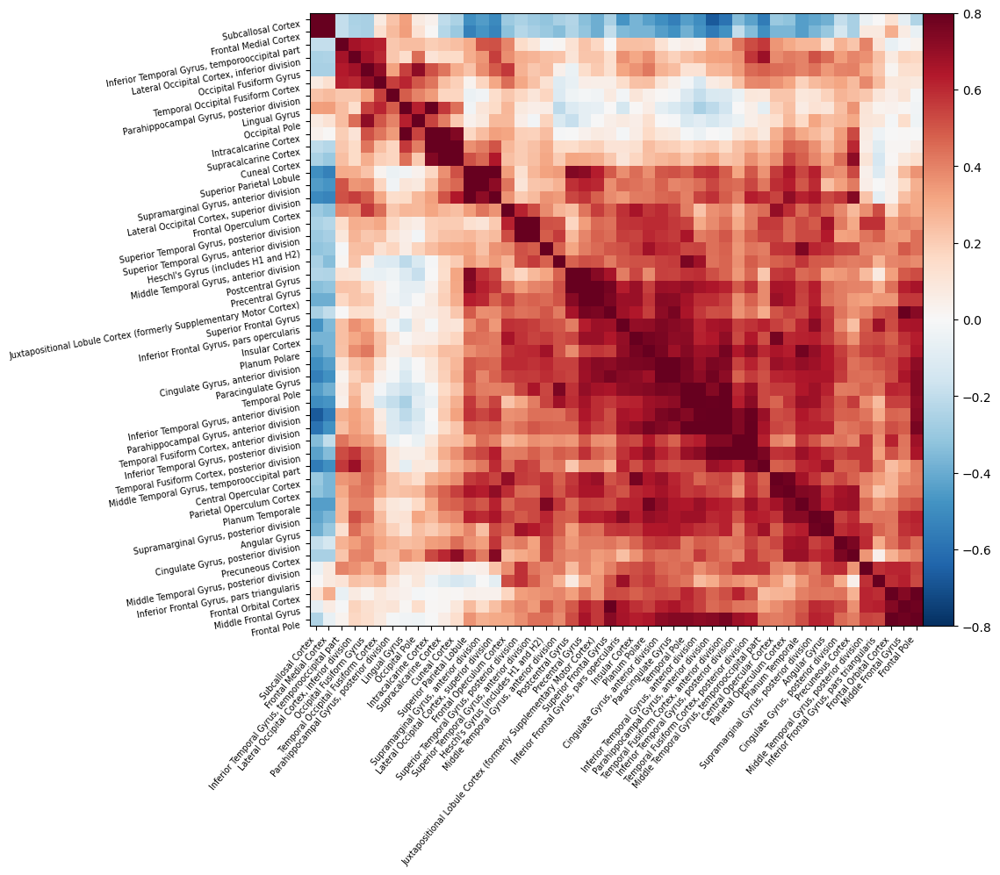

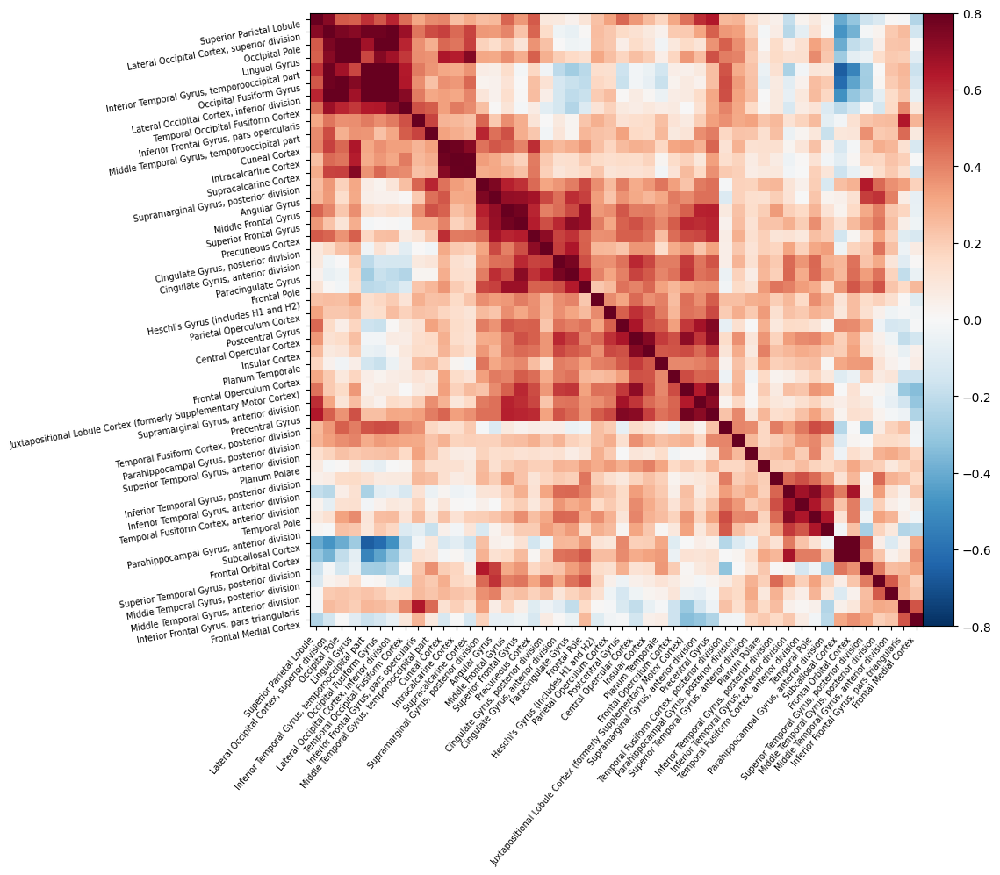

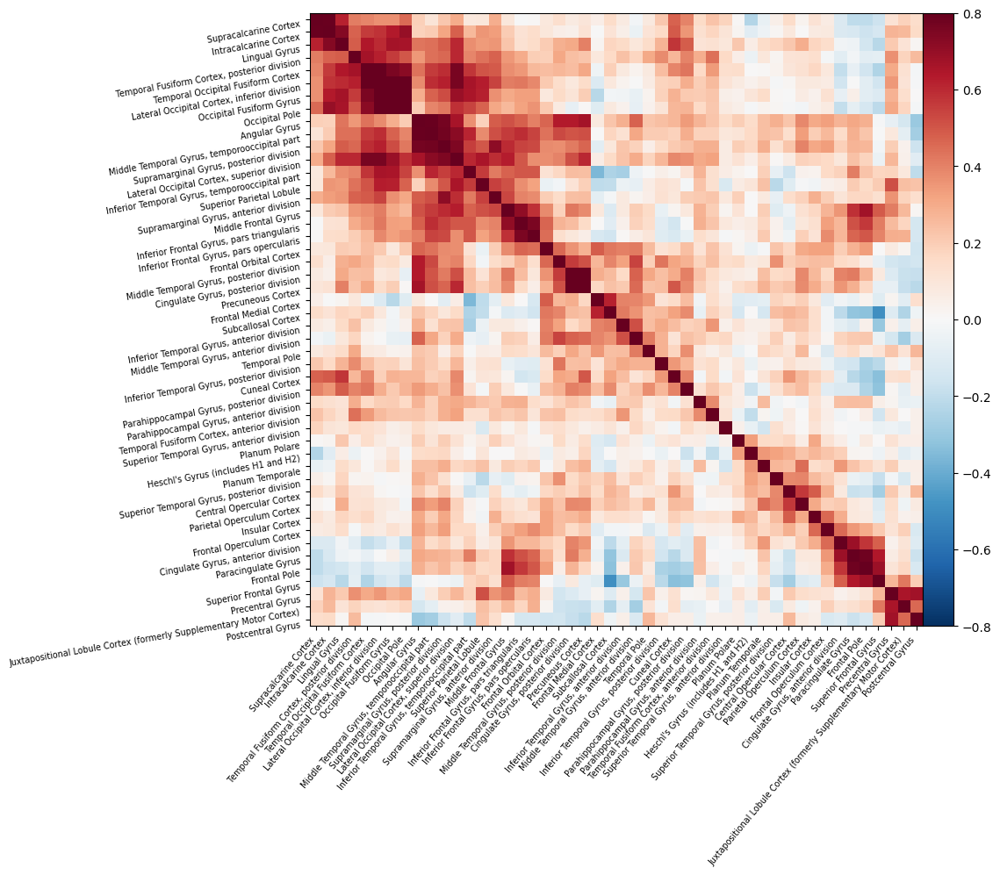

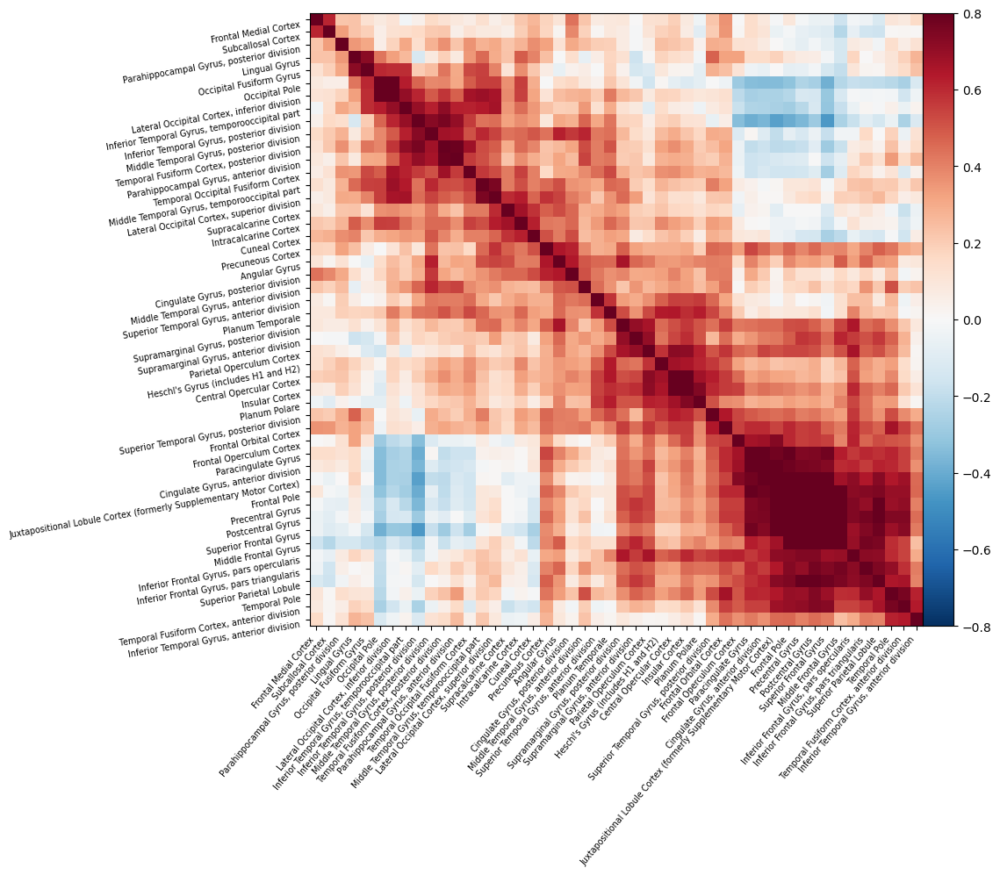

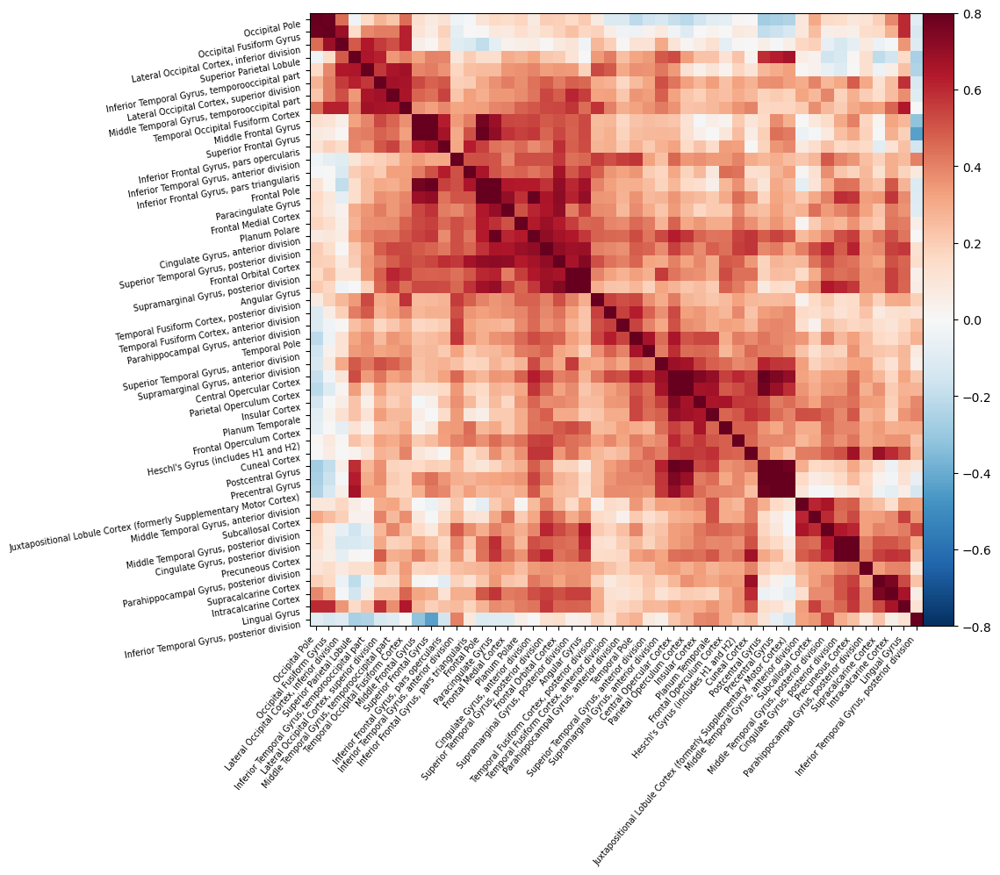

...

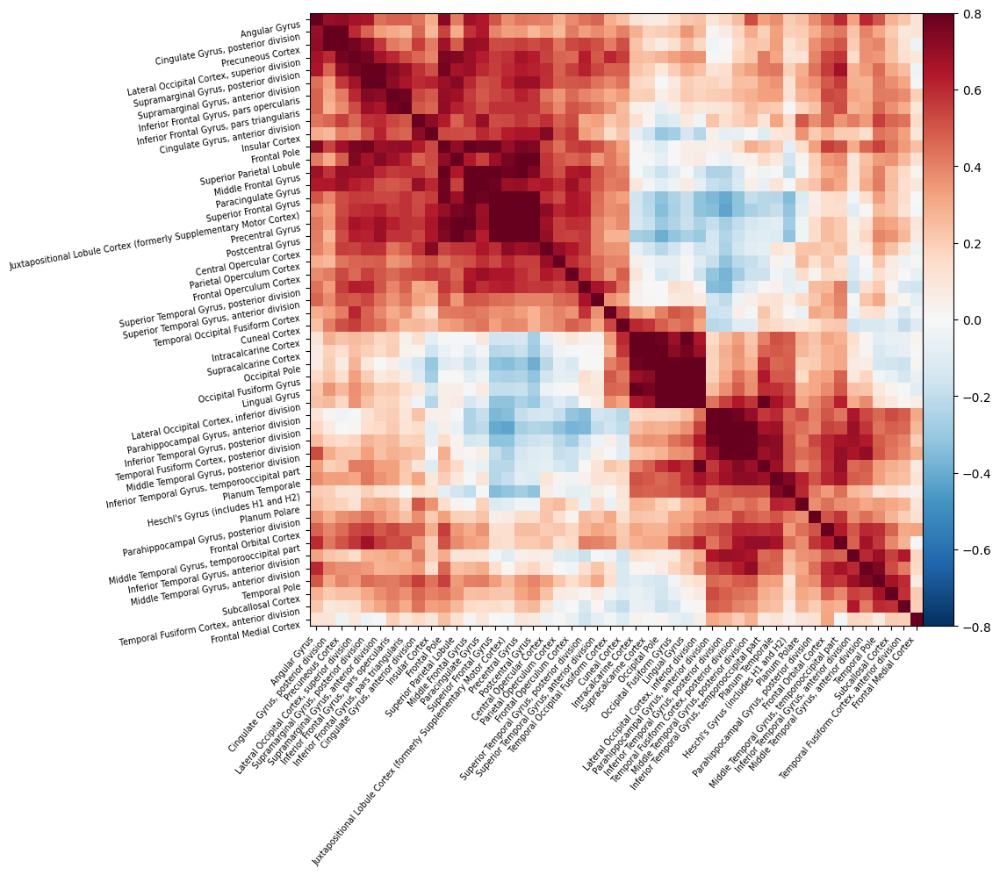

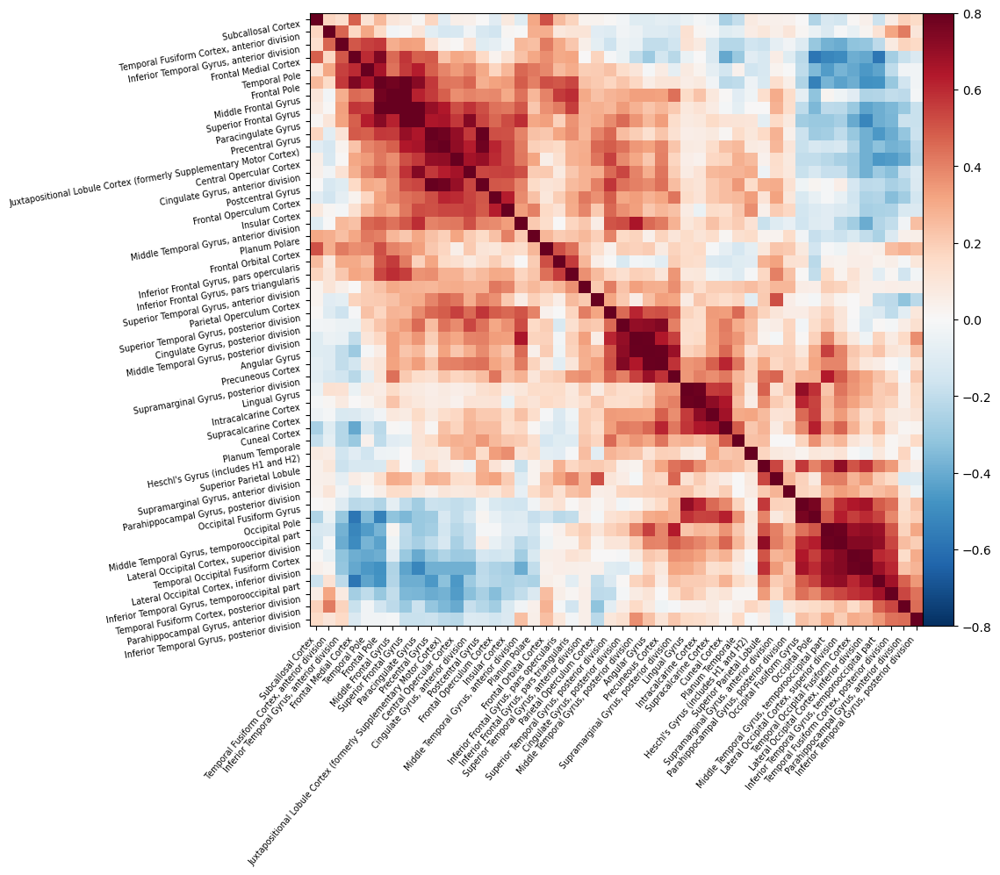

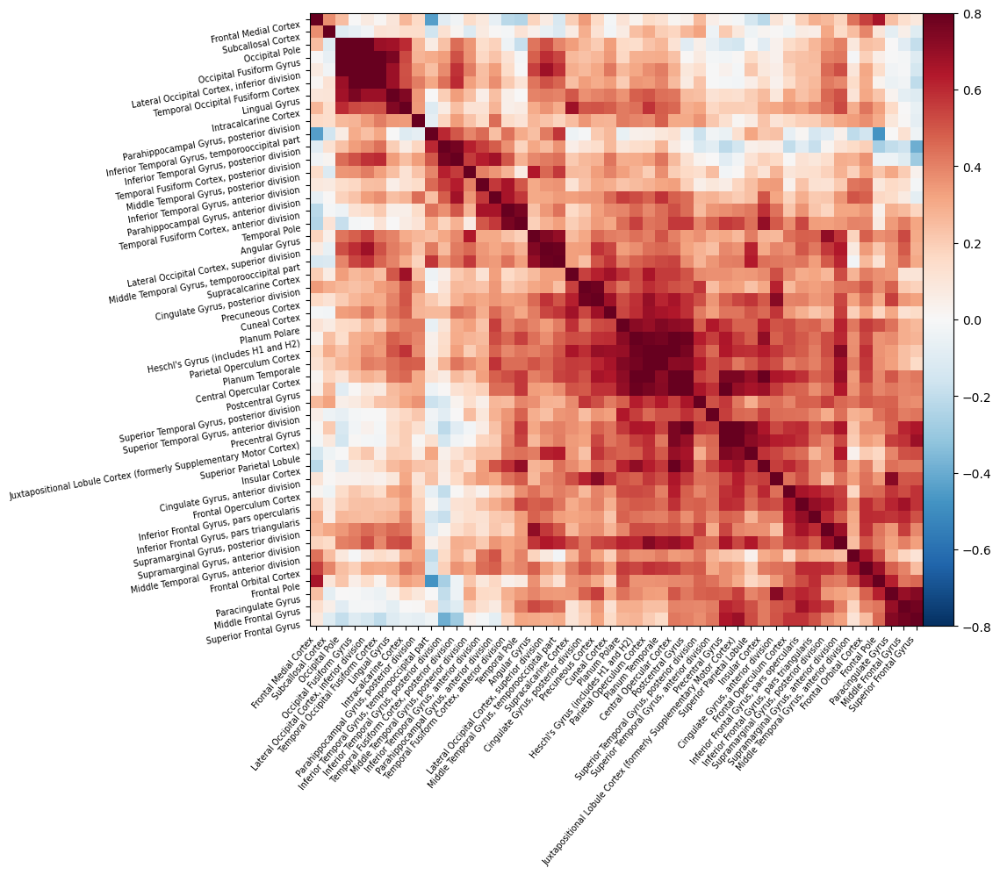

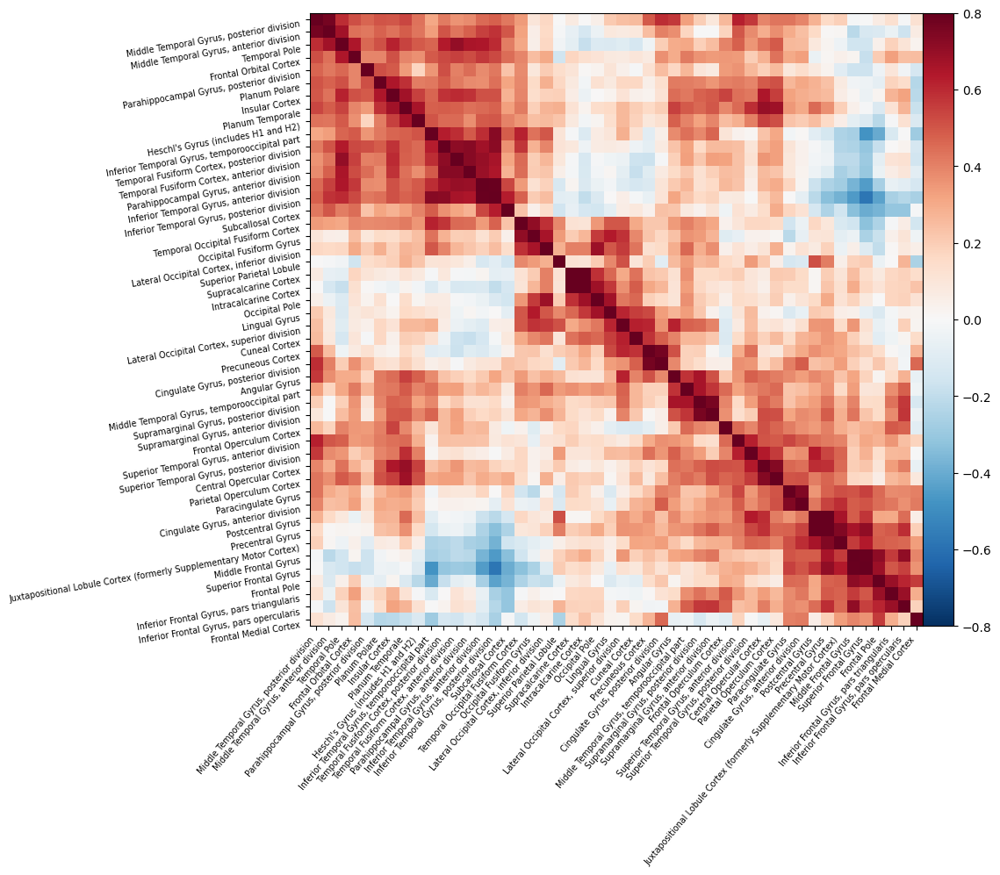

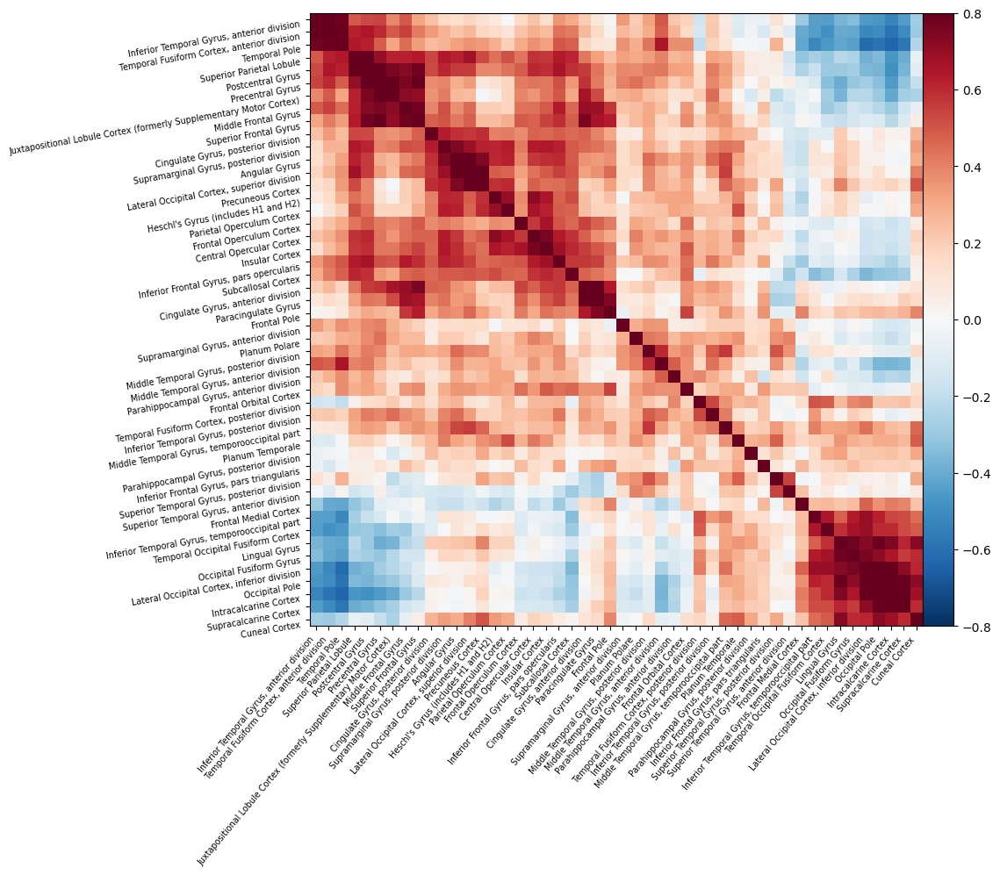

In [3]:

# Import preprocessed data
datagroup = glob.glob('/home/roya/Documents/BRAINHACK/project/Harvard/**/ses-01/func/*preproc_bold.nii.gz', recursive=True)
confound = glob.glob('/home/roya/Documents/BRAINHACK/project/Harvard/**/ses-01/func/*confounds_timeseries.tsv', recursive=True)

# Import Harvard atlas
atlas_harvard_oxford = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')
atlas_filename = atlas_harvard_oxford.maps
labels = atlas_harvard_oxford.labels
selected_labels = atlas_harvard_oxford.labels[1:]

# Extracting functional connectivity matrix
df = pd.read_excel('/home/roya/Documents/BRAINHACK/project/Harvard/nps_scores.xlsx')
depressed_df = df[df['BDI'] == 1]
nondepressed_df = df[df['BDI'] == 0]

depressed_matrices = []
nondepressed_matrices = []

for i in datagroup:
    label = i.split('/')[7]
    confounds_simple, sample_mask = load_confounds(i, strategy=["wm_csf"], motion="basic", wm_csf="basic")
    masker = maskers.NiftiLabelsMasker(labels_img=atlas_filename, standardize=True, memory='nilearn_cache', verbose=5)
    time_series = masker.fit_transform(i, confounds=confounds_simple, sample_mask=sample_mask)

    correlation_measure = ConnectivityMeasure(kind='correlation')
    correlation_matrix = correlation_measure.fit_transform([time_series])[0]
    c = connectome.sym_matrix_to_vec(correlation_matrix, discard_diagonal=True)
    np.save(f"/home/roya/Documents/BRAINHACK/project/Harvard/{label}.npy", c)

    bdi_score = df[df['Subject'] == label]['BDI'].values[0]

    selected_indices = [i for i, atlas_label in enumerate(labels) if atlas_label in selected_labels]
    submatrix = correlation_matrix

    if len(selected_labels) > 0 and submatrix.shape[0] == len(selected_labels):
        plotting.plot_matrix(submatrix, figure=(10, 8), labels=selected_labels, vmax=0.8, vmin=-0.8, reorder=True)

    if bdi_score == 1:
        depressed_matrices.append(submatrix)
    else:
        nondepressed_matrices.append(submatrix)

depressed_matrices = np.array(depressed_matrices)
nondepressed_matrices = np.array(nondepressed_matrices)

mean_depressed = np.mean(depressed_matrices, axis=0)
std_depressed = np.std(depressed_matrices, axis=0)
mean_nondepressed = np.mean(nondepressed_matrices, axis=0)
std_nondepressed = np.std(nondepressed_matrices, axis=0)

## Data Processing and Grouping based on BDI Scores for Connectivities Analysis

In [ ]:
# Create header names for the matrix
header_names = [f"{i}-{j}" for i in selected_labels for j in selected_labels]

# Convert header names to a matrix
matrix_size = int(np.sqrt(len(header_names)))
matrix = np.reshape(header_names, (matrix_size, matrix_size))

# Convert matrix to vector
A = connectome.sym_matrix_to_vec(matrix, discard_diagonal=True)
b = list(A)

# Collect file paths
vectorlist = sorted(glob.iglob('/home/roya/Documents/BRAINHACK/project/Harvard//sub-mp*.npy', recursive=True))

# Load the data from the file
data = pd.read_excel("/home/roya/Documents/BRAINHACK/project/Harvard/nps_scores.xlsx")

# Create a dictionary to store the subject IDs and BDI values
subject_bdi_dict = {}
for _, row in data.iterrows():
    subject_id = row["Subject"]
    bdi = row["BDI"]
    subject_bdi_dict[subject_id] = bdi

# Create two groups based on BDI values
depressed_group = []
nondepressed_group = []
for file_path in sorted(glob.glob('/home/roya/Documents/BRAINHACK/project/Harvard/*/*.npy')):
    subject_id = file_path.split("/")[-1].split(".")[0]
    bdi = subject_bdi_dict.get(subject_id)
    if bdi == 1:
        depressed_group.append(file_path)
    elif bdi == 0:
        nondepressed_group.append(file_path)

k = 0
depressed_data = []
nondepressed_data = []

# Creating lists
for i in vectorlist:
    subname = (i.split('/'))[7][0:10]
    k += 1
    data = np.load(i)
    num_columns = len(selected_labels)  # Number of columns based on labels_matrix

    # Ensure that the number of columns in data matches the number of columns in labels_matrix
    data = data[:num_columns]

    # Create the DataFrame with the correct number of columns
    df = pd.DataFrame([data], index=[subname], columns=selected_labels)

    # Check BDI value and add DataFrame to respective group
    bdi = subject_bdi_dict.get(subname)
    if bdi == 1:
        depressed_data.append(df)
    elif bdi == 0:
        nondepressed_data.append(df)

# Concatenate DataFrames for depressed group
depressed_data = pd.concat(depressed_data, ignore_index=False)

# Concatenate DataFrames for non-depressed group
nondepressed_data = pd.concat(nondepressed_data, ignore_index=False)

# Save the DataFrames to separate Excel files
depressed_data.to_excel("/home/roya/Documents/BRAINHACK/project/Harvard/dep/depressed_connectivities.xlsx")
nondepressed_data.to_excel("/home/roya/Documents/BRAINHACK/project/Harvard/nondep/nondepressed_connectivities.xlsx")


## Visualization of Atlas-based Coordinates for Depressed and Non-Depressed Groups

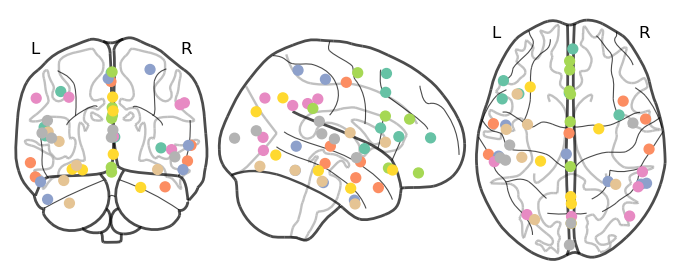

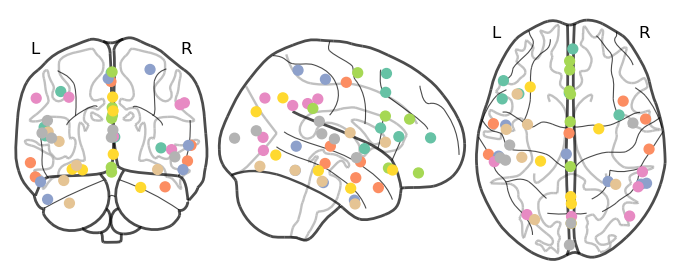

In [8]:
# Function to get coordinates for a given atlas
def get_coordinates(atlas_filename):
    values = np.unique(atlas_filename.get_fdata())[1:]
    coords = []
    for v in values:
        data = np.zeros_like(atlas_filename.get_fdata())
        data[atlas_filename.get_fdata() == v] = 1
        xyz = plotting.find_xyz_cut_coords(nib.Nifti1Image(data, atlas_filename.affine))
        coords.append(xyz)
    return coords



# Get coordinates for depressed group
depressed_coords = get_coordinates(atlas_filename)

# Visualize depressed group coordinates
plotting.plot_connectome(np.eye(len(depressed_coords)), depressed_coords)


# Get coordinates for non-depressed group
nondepressed_coords = get_coordinates(atlas_filename)

# Visualize non-depressed group coordinates
plotting.plot_connectome(np.eye(len(nondepressed_coords)), nondepressed_coords)

## Ploting of Functional Connectivity in Depressed and Non-Depressed Groups

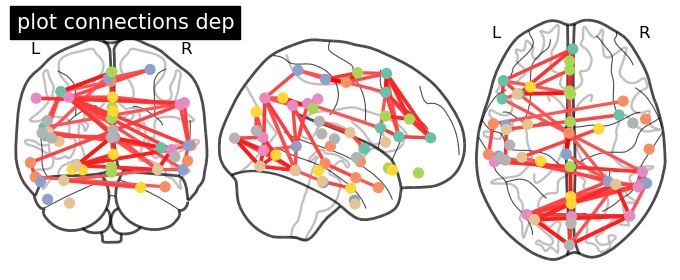

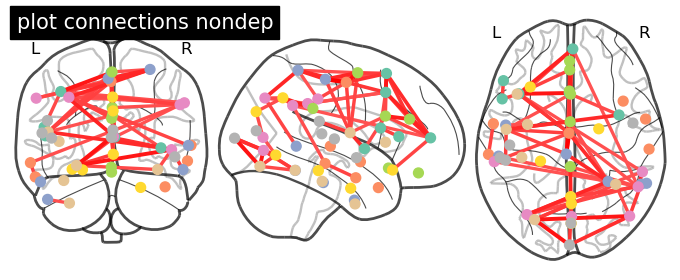

In [9]:
# ploting connections dep
dep_output = plotting.plot_connectome(mean_depressed, depressed_coords, edge_threshold='95%', title="plot connections dep")
display(dep_output)

# ploting connections nondep
nondep_output = plotting.plot_connectome(mean_nondepressed, nondepressed_coords, edge_threshold='95%', title="plot connections nondep")
display(nondep_output)


## Visualization of Functional Connectivity in Depressed and Non-Depressed Groups

In [60]:
# Visualize connections dep
dep_output = plotting.view_connectome(mean_depressed, depressed_coords, edge_threshold='95%')
display(Markdown("## Visualize connections dep"))
display(dep_output)

# Visualize connections nondep
nondep_output = plotting.view_connectome(mean_nondepressed, nondepressed_coords, edge_threshold='95%')
display(Markdown("## Visualize connections nondep"))
display(nondep_output)


## Visualize connections dep

## Visualize connections nondep

### Create a new faunctional connectivities file based on labels of Interest and neurobehavioral data


In [65]:
# Load the data from Excel file
df_connectivities = pd.read_excel('/home/roya/Documents/BRAINHACK/brainhack-project/connectivities_NPS.xlsx')
data = df_connectivities

# Extract the relevant columns
connectivities = data['connectivities']
bdi = data['BDI']

# Separate the connectivities into two groups based on depression status
depressed_connectivities = connectivities[bdi == 1]
non_depressed_connectivities = connectivities[bdi == 0]

# Perform T-test
t_statistic, p_value = ttest_ind(depressed_connectivities, non_depressed_connectivities)

# Print the results
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)


T-Statistic: -2.1285744408976934
P-Value: 0.034839969587321724


In [66]:
df_connectivities

,subjects,connections,connectivities,BDI,UPDRS,MCI
0,1,1,0.304139,1,11,1
1,1,2,0.438628,1,11,1
2,1,3,0.247141,1,11,1
3,1,4,0.246869,1,11,1
4,1,5,0.182651,1,11,1
...,...,...,...,...,...,...
155,16,6,0.097312,0,22,0
156,16,7,0.047990,0,22,0
157,16,8,0.558486,0,22,0
158,16,9,0.700038,0,22,0


## Connectivity Distribution by Group: Depressed vs. Non-Depressed

In [28]:

# Create box plot data
boxplot_data = [depressed_connectivities, non_depressed_connectivities]

# Create group labels
labels = ['Depressed', 'Non-Depressed']

# Create box plot
fig = go.Figure()
for i, data in enumerate(boxplot_data):
    fig.add_trace(go.Box(
        y=data,
        name=labels[i],
        boxpoints='all',
        jitter=0.4,
        pointpos=-1.8
    ))

# Customize layout
fig.update_layout(
    title='Connectivity Distribution by Group',
    xaxis_title='Group',
    yaxis_title='Connectivity',
    showlegend=False
)

fig.show()


## Linear Regression for Predicting MCI using Connectivities and BDI Scores

In [29]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df_connectivities[['connectivities', 'BDI']], df_connectivities['MCI'], test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print('Mean Squared Error:', mse)
print('R-squared:', r2)


Mean Squared Error: 0.27874848987208
R-squared: -0.11499395948832003


In [51]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df_connectivities[['connectivities', 'BDI']], df_connectivities['MCI'], test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print('Mean Squared Error:', mse)
print('R-squared:', r2)

# Create a scatter plot using Plotly
fig = px.scatter(x=y_test, y=y_pred, labels={'x': 'Actual MCI', 'y': 'Predicted MCI'})
fig.update_layout(title='Actual vs. Predicted Linear Regression Model for MCI Prediction')
fig.show()

Mean Squared Error: 0.27874848987208
R-squared: -0.11499395948832003


## Mixed Effects Linear Regression Model for MCI Prediction

In [62]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(df_connectivities[['connectivities', 'BDI']], df_connectivities['MCI'], test_size=0.2, random_state=42)

# Add intercept column to the predictor variables
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Create a linear regression mixed effect model
model = sm.MixedLM(y_train, X_train, groups=y_train)

# Fit the model
result = model.fit()

# Make predictions on the test set
y_pred = result.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print('Mean Squared Error:', mse)
print('R-squared:', r2)

Mean Squared Error: 0.25000004168708934
R-squared: -1.6674835734420412e-07


/home/roya/miniconda3/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning:

The MLE may be on the boundary of the parameter space.



In [64]:
# Create a scatter plot
scatter = go.Scatter(
    x=y_test,  # Actual values
    y=y_pred,  # Predicted values
    mode='markers',
    marker=dict(
        color='blue',
        size=6
    ),
    name='Actual vs. Predicted'
)

# Create layout
layout = go.Layout(
    title='Actual vs. Predicted MixedLM',
    xaxis=dict(title='Actual Values'),
    yaxis=dict(title='Predicted Values')
)

# Create figure
fig = go.Figure(data=[scatter], layout=layout)

# Show the figure
fig.show()
